In [88]:
import cv2 as cv
import matplotlib.pyplot as plt

# Helper function
def cv2_imshow(image,color='rgb'):
    color_mode_dct = {'rgb' :cv.COLOR_BGR2RGB, # This is becasue the default im reader for cv2 is BGR not RGB
                      'gray' : cv.COLOR_RGB2BGR }
    
    color_mode = color_mode_dct[color]
    image = cv.cvtColor(image,color_mode)
    plt.imshow(image)
    plt.show()

Binary image is gray image (1 channel)

So, RGB is not binary images

# Contour 

- Contour is any boundary; line or curve continuous
- edge != Contour
- edge is gradient between pixels
- contour aim to close the edge to continuous line

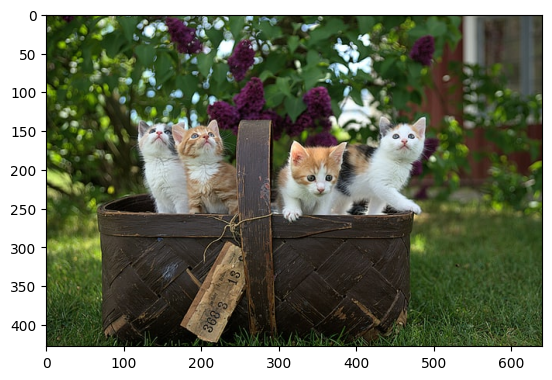

In [2]:
img = cv.imread('images/Photos/cats.jpg') # This return array
cv2_imshow(img)

Q: What's difference between BGR and RGB

A : RGB and BGR is the opposite, the first channel for RGB is red, while BGR is blue

Q : Why OPEN CV Chose BGR over RGB as default

A : OpenCV reads in images in BGR format (instead of RGB) because when OpenCV was first being developed, BGR color format was popular among camera manufacturers and image software providers. The red channel was considered one of the least important color channels, so was listed last, and many bitmaps use BGR format for image storage. However, now the standard has changed and most image software and cameras use RGB format, which is why, in programs, it's good practice to initially convert BGR images to RGB before analyzing or manipulating any images.

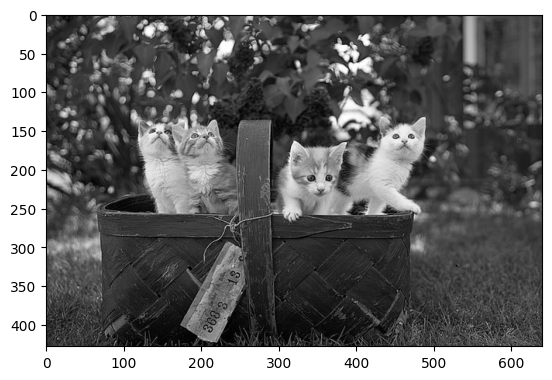

In [3]:
# Tips : RGB and BGR is the opposite
# the first channel for RGB is red, while BGR is blue

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)

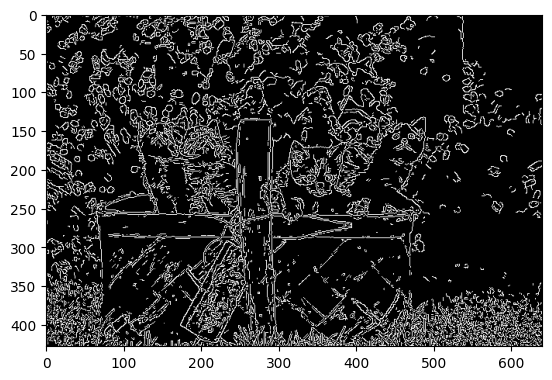

In [4]:
canny = cv.Canny(img, 125,175)
cv2_imshow(canny)

Before running code, we have to understand how opencv do contour

- How can I know the points of this belong to which contour
- What is the index of this contour

It is useful to learn from the below resources

![](https://docs.opencv.org/4.x/hierarchy.png)

Given the canny image is like the above, since there are many ways to obtain all shape, so, you can config it

- Note that the 2 (is external of contour-2) and 2a (internal of contour-2), If we ignore 2a, then we won't get the things inside contour-2

- Note that contour can be line or shape

- Heirarchy is divided into 2 classes: Parent and child

- Child shape is inside Parent

## How hierarchical:
So each contour has its own information regarding what hierarchy it is, who is its child, who is its parent etc. OpenCV represents it as an array of four values : [Next, Previous, First_Child, Parent]

## Example: 

![re](https://docs.opencv.org/4.x/hierarchy.png)

"Next denotes next contour at the same hierarchical level"

So, Heirarchical from this picture is 
1. (0,1,2) แก่สุด,  
2. (3) เป็นลูกของ (2), 
3. (4,5) เป็นลูกของ (3)

For example, 
- take contour-0 in our picture. Who is next contour in its same level ? It is contour-1. So simply put Next = 1. Similarly for Contour-1, next is contour-2. So Next = 2.

- What about contour-2? There is no next contour in the same level. So simply, put Next = -1. What about contour-4? It is in same level with contour-5. So its next contour is contour-5, so Next = 5.

- First_Child denotes its first child contour, There is no need of any explanation. For contour-2, child is contour-2a. So it gets the corresponding index value of contour-2a. What about contour-3a? It has two children. But we take only first child. And it is contour-4. So First_Child = 4 for contour-3a.

Note that this will only apply for Retreival Mode Argument RETR_TREE

## Retreival Mode Argument:
### cv.RETR_LIST 
ไม่มีใครเป็นลูกใครท้้งนั้น, ดังนั้น
`
|hierarchy|
|---|
|[ 1, -1, -1, -1],|
|[ 2,  0, -1, -1],|
|[ 3,  1, -1, -1],|
|[ 4,  2, -1, -1],|
|[ 5,  3, -1, -1],|
|[ 6,  4, -1, -1],|
|[ 7,  5, -1, -1],|
|[-1,  6, -1, -1]|

ดังนั้น column3,4 จะเป็น -1 

### 2. RETR_EXTERNAL
only eldest parent are in
|hierarchy|
|---|
|[ 1, -1, -1, -1],|
|[ 2,  0, -1, -1],|
|[ 3,  1, -1, -1],|

### 3. RETR_CCOMP

Now the heirarchical only have 2 ranks : 1 and 2. 

1 cannot have parent, but can have child
2 cannot have child, but can have parent

Look at the new image

![](https://docs.opencv.org/4.x/ccomp_hierarchy.png)

The order of contour is from inner to outer, the inner contour is 0

For contour-0

- Since the next have to be the same level (rank 1) which is its outer contour-3 : 3
- Since its have no previous, so None : -1
- Since its child (with rank2) is contour-1 : 1
- Since it has no parent (Recall, the rank 1 cannot have parent) : -1

So, the first array for contour-0 is [3,-1,1,-1]

For Contour-1

- Since the next have to be the same level (rank 2) which is its nearby contour : 2
- Since its have no previous, so None : -1
- Since rank-2 contour cannot have child, so : -1
- Since its parent is contour-0 : 0

For Contour-2

- Since the next have to be the same level (rank 2) but no its next contour, so None : -1
- Since its previous contour (which is the same level) is contour-1 : 1
- Since its child (with rank2) is contour-1 : -1
- Since its parent is contour-0 : 0

For Contour-3

- Since the next have to be the same level (rank 2) which is its nearby contour : 5
- Since its have no previous, so None : -1
- Since rank1 contour cannot have child : -1
- Its inner is represented as contour-4 (with rank2) : 4
 
and, so on, you will get

```
>>> hierarchy
array([[[ 3, -1,  1, -1],
        [ 2, -1, -1,  0],
        [-1,  1, -1,  0],
        [ 5,  0,  4, -1],
        [-1, -1, -1,  3],
        [ 7,  3,  6, -1],
        [-1, -1, -1,  5],
        [ 8,  5, -1, -1],
        [-1,  7, -1, -1]]])
```

### 4. RETR_TREE

As, we have already explained how heirarchy in opencv works, and it uses that idea

![re2](https://docs.opencv.org/4.x/tree_hierarchy.png)

```
>>> hierarchy
array([[[ 7, -1,  1, -1],
        [-1, -1,  2,  0],
        [-1, -1,  3,  1],
        [-1, -1,  4,  2],
        [-1, -1,  5,  3],
        [ 6, -1, -1,  4],
        [-1,  5, -1,  4],
        [ 8,  0, -1, -1],
        [-1,  7, -1, -1]]])
```

Now, we gonna show you how we compute the points for each contour


## Method

![](https://docs.opencv.org/3.4/none.jpg)


1. CHAIN_APPROX_NONE : 
- Choose all points to approximate the contour
- from example : (734 points)

2. CHAIN_APPROX_SIMPLE : Only the vertice (4 points only) 
- Choose only the corner point of contour (This work great for linear, since it do not require you to approx)
- from example : (4 points)


In [5]:
# Let's do RETR_LIST, and method=CHAIN_APPROX_NONE

contours, hierarchies = cv.findContours(canny, mode=cv.RETR_LIST, method = cv.CHAIN_APPROX_NONE)

In [6]:
# There are 2794 contours (wherer 4 represent (Next, Previous, First child, Parent))
# The heirarchies is useful when we want to retreive the needed contour

hierarchies.shape

(1, 2794, 4)

In [7]:
# You can see each contour does not have same number of points
# We expect the number of points for the large contour like cat to be high

for contour_index in range(len(contours)):
    if contour_index % 100 == 0:
        print(f'contour-{contour_index} have {contours[contour_index].shape[0]} points')

contour-0 have 1 points
contour-100 have 3 points
contour-200 have 12 points
contour-300 have 6 points
contour-400 have 18 points
contour-500 have 6 points
contour-600 have 3 points
contour-700 have 7 points
contour-800 have 4 points
contour-900 have 4 points
contour-1000 have 104 points
contour-1100 have 7 points
contour-1200 have 2 points
contour-1300 have 27 points
contour-1400 have 6 points
contour-1500 have 18 points
contour-1600 have 6 points
contour-1700 have 10 points
contour-1800 have 22 points
contour-1900 have 4 points
contour-2000 have 2 points
contour-2100 have 23 points
contour-2200 have 2 points
contour-2300 have 12 points
contour-2400 have 3 points
contour-2500 have 7 points
contour-2600 have 20 points
contour-2700 have 40 points


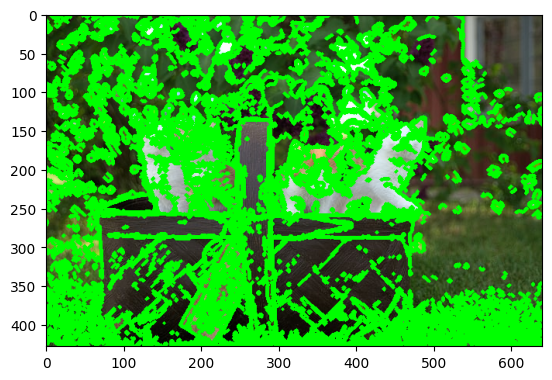

In [8]:
point_color = (0, 255, 0) # Green
thickness = 3

for contour in contours:
    cv.drawContours(img, contour, -1, point_color, thickness) 
    # You can change contour to contours as well, instead of draw individual point
    # But if you only some contour with some specific condition, use for-loop

cv2_imshow(img) # Here's all points of all contours

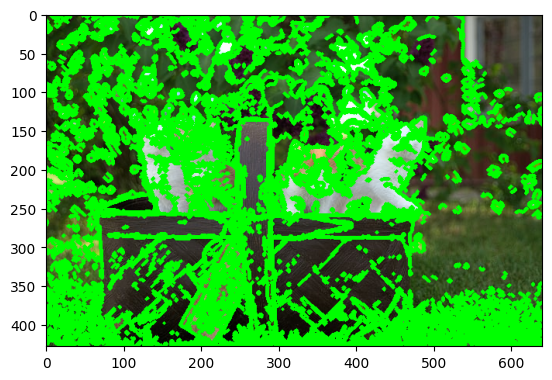

In [9]:
# Say we want just the contour with many points

for contour_index in range(len(contours)):
    if contours[contour_index].shape[0] >= 100:
        cv.drawContours(img, contours[contour_index], -1, (0, 255, 0), 3)

cv2_imshow(img) # Here's all points of all contours

In [10]:
contours[100].shape

(3, 1, 2)

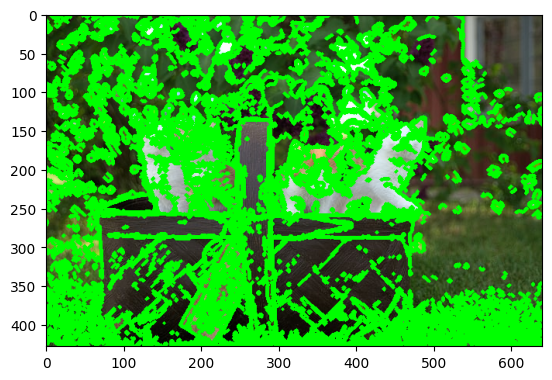

In [11]:
from copy import deepcopy

img_ = deepcopy(img)

# Say we want just the contour with many points

for contour_index in range(len(contours)):
    if contours[contour_index].shape[0] >= 100:
        cv.drawContours(img_, contours[contour_index], -1, (0, 255, 0), 3)

cv2_imshow(img_) # Here's all points of all contours

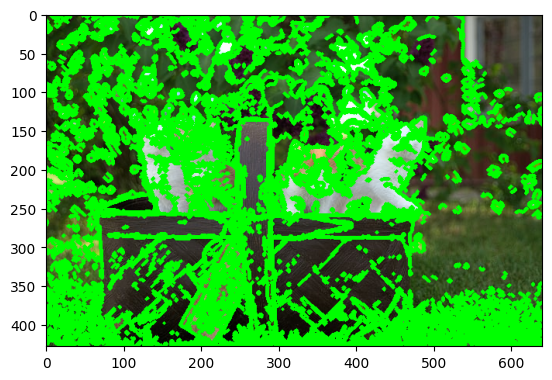

In [12]:
# What about 500
from copy import deepcopy

img_ = deepcopy(img)

# Say we want just the contour with many points

for contour_index in range(len(contours)):
    if contours[contour_index].shape[0] >= 500:
        cv.drawContours(img_, contours[contour_index], -1, (0, 255, 0), 3)

cv2_imshow(img_) # Here's all points of all contours

## mode=EXTERNAL

In [13]:
# Let's do RETR_EXTERNAL, and method=CHAIN_APPROX_NONE

contours, hierarchies = cv.findContours(canny, mode=cv.RETR_EXTERNAL, method = cv.CHAIN_APPROX_SIMPLE)

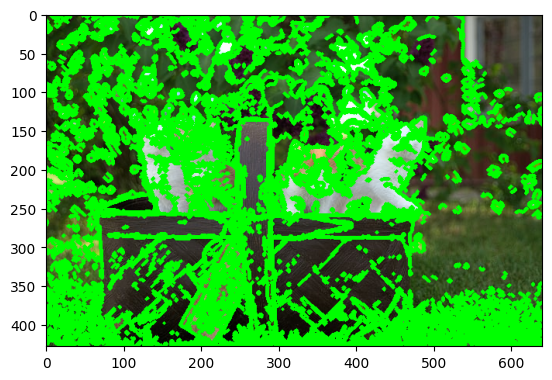

In [14]:
from copy import deepcopy

img_ = deepcopy(img)

for contour_index in range(len(contours)):
    cv.drawContours(img_, contours[contour_index], -1, (0, 255, 0), 3)

cv2_imshow(img_) # Here's all points of all contours

## the another way to get better contour is to use threshold

- Threshold is for gray image (1 channel)
- If the pixel is not in the boundm then will set to zero, otherwise one

What about for RGB image ? -> You can use InRange instead
ref : https://stackoverflow.com/questions/7722519/fast-rgb-thresholding-in-python-possibly-some-smart-opencv-code

In [15]:
img = cv.imread('images/Photos/cats.jpg') # This return array
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

In [16]:
# These threshold (125,255) will only pick the bright pixel (close to white)
# ret : just lower bound (125)

ret, thresh = cv.threshold(gray,125,255,cv.THRESH_BINARY)

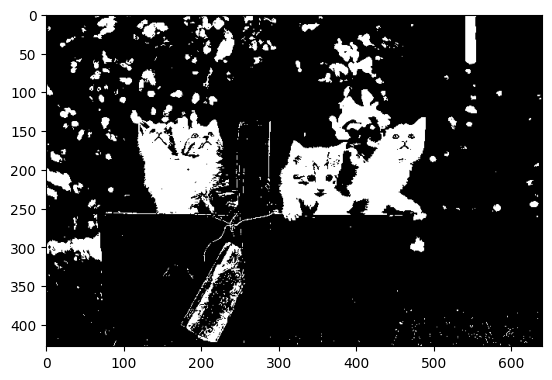

In [17]:
cv2_imshow(thresh,'gray')

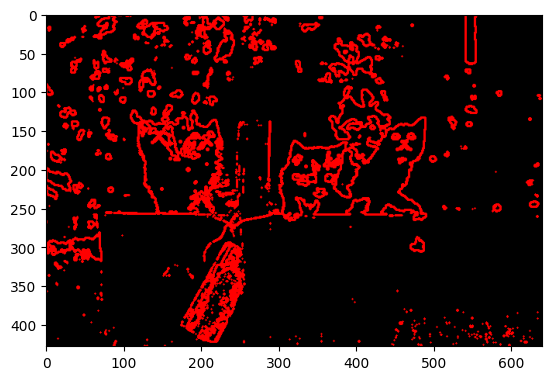

In [18]:
# Let's draw contour from this thresholded image on blank canvas

import numpy as np
blank = np.zeros(img.shape,dtype='uint8')

# Let's do RETR_LIST, and method=CHAIN_APPROX_NONE

contours, hierarchies = cv.findContours(thresh, mode=cv.RETR_LIST, method = cv.CHAIN_APPROX_NONE)

cv.drawContours(blank, contours, -1, (0, 0, 255), 2) 
cv2_imshow(blank)

LET COMPARE the contour by 
- blur + canny 
- threshold

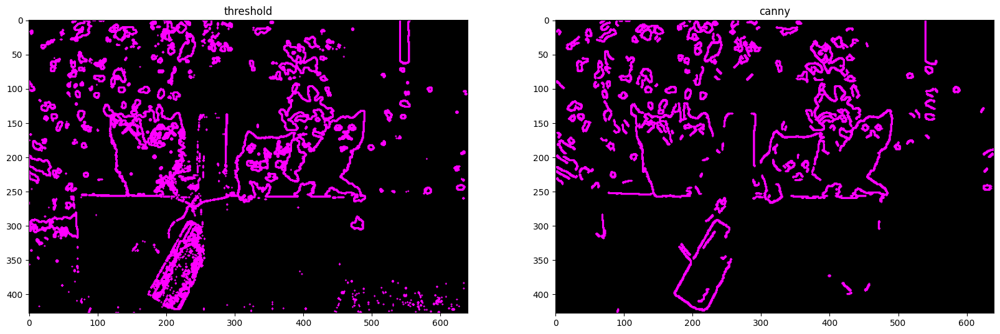

In [19]:
blank_can = np.zeros(img.shape,dtype='uint8')
blank_thresh = np.zeros(img.shape,dtype='uint8')

# blur + canny
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
blur = cv.GaussianBlur(gray,(5,5), cv.BORDER_DEFAULT)
canny = cv.Canny(blur, 125,175)

# threshold
_, thresh = cv.threshold(gray,125,255,cv.THRESH_BINARY)

contours_thesh, _ = cv.findContours(thresh, mode=cv.RETR_LIST, method = cv.CHAIN_APPROX_NONE)
contours_can, _ = cv.findContours(canny, mode=cv.RETR_LIST, method = cv.CHAIN_APPROX_NONE)

cv.drawContours(blank_thresh, contours_thesh, -1, (255, 0, 255), 2) 
cv.drawContours(blank_can, contours_can, -1, (255, 0, 255), 2) 


fig, ax = plt.subplots(1,2, figsize=(20, 10))

ax[0].imshow(blank_thresh)
ax[0].set_title('threshold') # On bright pixel
ax[1].imshow(blank_can)
ax[1].set_title('canny')

plt.show()

The guildline to find contour:

1. Try Blur + canny first
2. Try Thresholding

# Color space

- by default, we only know BGR, and grayscale

but, in reality, there is more like HSV, L\*a\*b

HSV : hue, saturation, value/brightness

LAB : 
- L* : represents lightness from black to white on a scale of zero to 100, 
- a* and b* represent chromaticity with no specific numeric limits.

In [20]:
img = cv.imread('images/Photos/park.jpg') # This return array

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV) # hsv color 
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB) # lab color

In [21]:
lab.shape

(427, 640, 3)

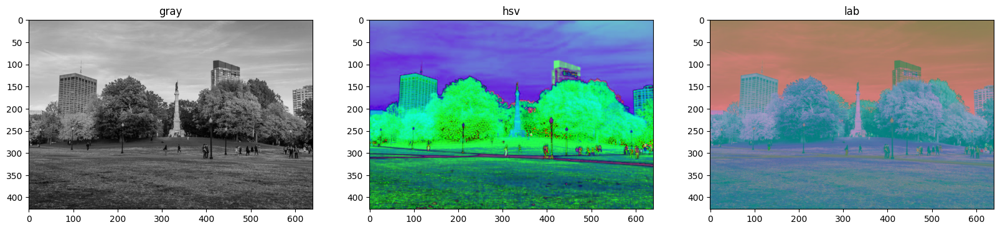

In [34]:
# Display 
fig, ax = plt.subplots(1,3, figsize=(20, 10))

ax[0].imshow(gray,cmap='gray')
ax[0].set_title('gray') # On bright pixel
ax[1].imshow(hsv)
ax[1].set_title('hsv')
ax[2].imshow(lab)
ax[2].set_title('lab')

plt.show()

# Color Channel

- simply channel B, G, R
- This section will inspect individually

In [35]:
img = cv.imread('images/Photos/park.jpg') # This return array

In [36]:
# r = img[:,:,2]

b,g,r = cv.split(img)

In [37]:
print('shape of blue :', b.shape)
print('shape of green :', g.shape)
print('shape of red :', r.shape)

# When we viz these, each will display as grayscale automatically, since they all have 1 channel

shape of blue : (427, 640)
shape of green : (427, 640)
shape of red : (427, 640)


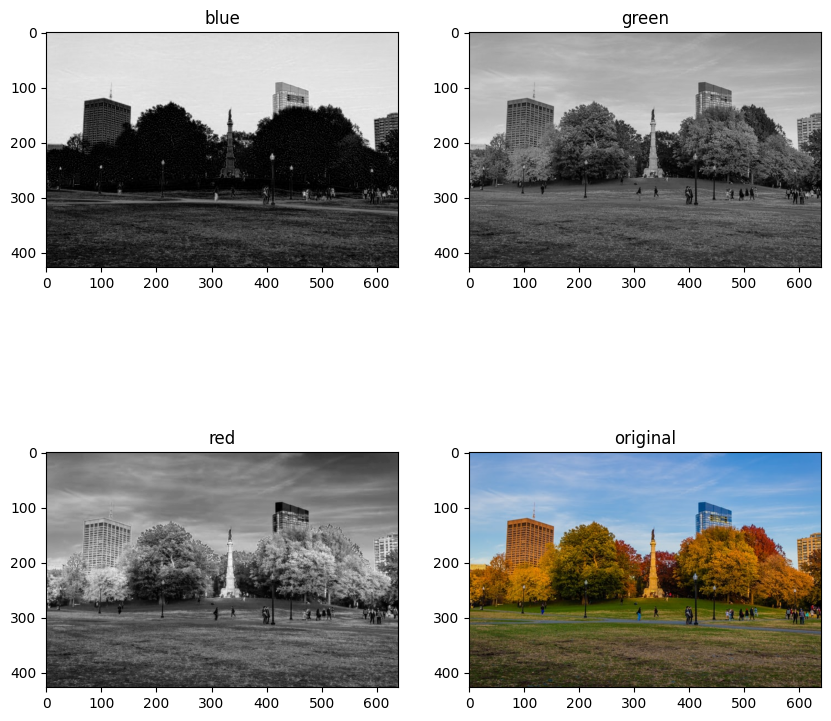

In [42]:
fig, ax = plt.subplots(2,2, figsize=(10, 10))

ax[0,0].imshow(b,cmap='gray')
ax[0,0].set_title('blue') # On bright pixel
ax[0,1].imshow(g,cmap='gray')
ax[0,1].set_title('green')
ax[1,0].imshow(r,cmap='gray')
ax[1,0].set_title('red') # On bright pixel
ax[1,1].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
ax[1,1].set_title('original') # On bright pixel
plt.show();

The brighter the pixel, the high value it is

From this, this means the tree in picture have the blue channel as very low pixel, most of it comprise of very high in green and red

May be you want to display in BGR format

In [44]:
blank = np.zeros(img.shape[:2],dtype='uint8')

blue = cv.merge([b,blank,blank])
green = cv.merge([blank,g,blank])
red = cv.merge([blank,blank,r])


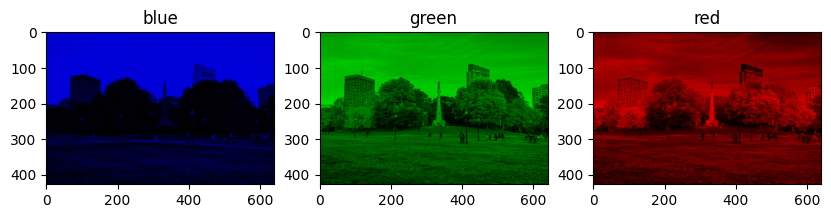

In [46]:
fig, ax = plt.subplots(1,3, figsize=(10, 10))

ax[0].imshow(cv.cvtColor(blue,cv.COLOR_BGR2RGB))
ax[0].set_title('blue') # On bright pixel
ax[1].imshow(cv.cvtColor(green,cv.COLOR_BGR2RGB))
ax[1].set_title('green')
ax[2].imshow(cv.cvtColor(red,cv.COLOR_BGR2RGB))
ax[2].set_title('red') # On bright pixel
plt.show();

# black in the color channel, mean it contain zero pixel on that

# Blurring (Advanced)

- The method for how we blur it
- Why it remove noise

When you make edge detection, you don't want the noise (the small pixel) to be a part of edge, we can use blurring technique to remove that

Blurring make the central pixel in the local spatial feature got distorted by the surrounding, which make the central pixel does not fully shined, the result of the image is that every pixel got distorted, 

This make the noise pixel also got distorted by its surrounding context

Unlike the main pixel which mostly have many pixels belong to its contour, so you do not expect much of getting blur

The larger the kernel size is, the more blur it is, this is because the central pixel got distorted too much by the large nearby pixels

Many types of blurring opencv offered
1. Averaging 
2. Gaussian
3. Median
4. Bi

![](https://i.stack.imgur.com/dw60I.png)
Using median blur

In [47]:
img = cv.imread('images/Photos/cats.jpg') # This return array

## Averaging

- every pixel in local spatial feature have same weight 

![](images/resource/avg_blur.png)

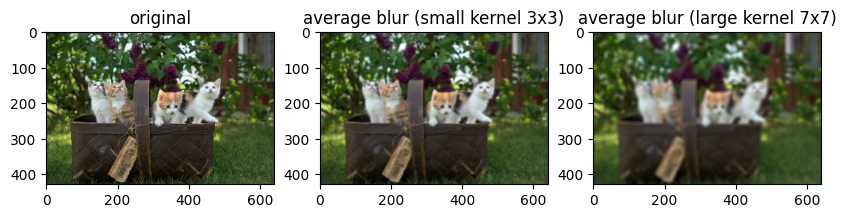

In [62]:
avg_blur_small = cv.blur(img,(5,5))
avg_blur_large = cv.blur(img,(11,11))

fig, ax = plt.subplots(1,3, figsize=(10, 20))

ax[0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
ax[0].set_title('original') # On bright pixel
ax[1].imshow(cv.cvtColor(avg_blur_small,cv.COLOR_BGR2RGB))
ax[1].set_title('average blur (small kernel 3x3)')
ax[2].imshow(cv.cvtColor(avg_blur_large,cv.COLOR_BGR2RGB))
ax[2].set_title('average blur (large kernel 7x7)')
plt.show()

## Gaussian Blur

- The weight for each pixel is differ, the central pixel got the highest. (weight as prob density func)

- The mean of normal distribution is at the central pixel 

- We can specify the sigma_x, sigma_y, since the variance for x and y-axis does not have to be the same

![](https://i0.wp.com/www.adeveloperdiary.com/wp-content/uploads/2019/05/kernels-Applying-Gaussian-Smoothing-to-an-image-using-Python-from-scratch-adeveloperdiary.com_.jpg?w=976)

Note that the variance of both axis are same

See the weight at the central pixel is largest

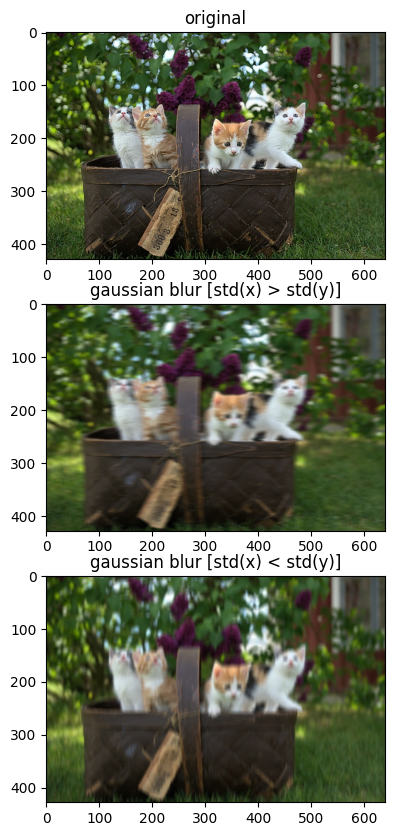

In [72]:
# To show difference, we use too large kernel size 15x15
gaussian_blur_high_x = cv.GaussianBlur(img,(11,11),sigmaX = 10, sigmaY = 1)
gaussian_blur_high_y = cv.GaussianBlur(img,(11,11),sigmaX = 1, sigmaY = 10)

fig, ax = plt.subplots(3,1, figsize=(10, 10))

ax[0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
ax[0].set_title('original') # On bright pixel
ax[1].imshow(cv.cvtColor(gaussian_blur_high_x,cv.COLOR_BGR2RGB))
ax[1].set_title('gaussian blur [std(x) > std(y)]')
ax[2].imshow(cv.cvtColor(gaussian_blur_high_y,cv.COLOR_BGR2RGB))
ax[2].set_title('gaussian blur [std(x) < std(y)]')
plt.show()

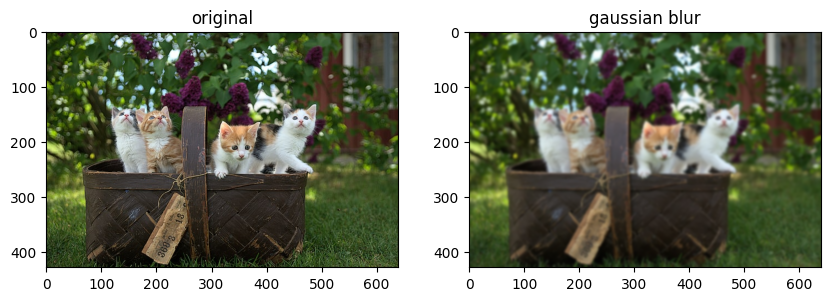

In [73]:
# The most default way people do this is 

gaussian_blur = cv.GaussianBlur(img,(11,11),0)

fig, ax = plt.subplots(1,2, figsize=(10, 10))

ax[0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
ax[0].set_title('original') # On bright pixel
ax[1].imshow(cv.cvtColor(gaussian_blur,cv.COLOR_BGR2RGB))
ax[1].set_title('gaussian blur')
plt.show()

# Median Blur

- Nothing much explained

![](https://docs.gimp.org/2.10/en/images/filters/examples/blur/median-calcul.png)

- We will do this each color channel independently

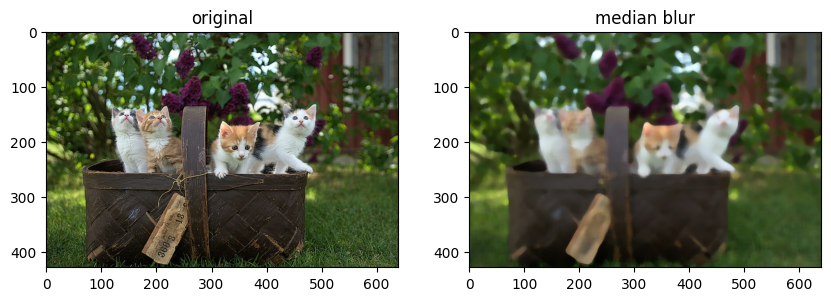

In [68]:
# The most default way people do this is 

median_blur = cv.medianBlur(img,11)

fig, ax = plt.subplots(1,2, figsize=(10, 10))

ax[0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
ax[0].set_title('original') # On bright pixel
ax[1].imshow(cv.cvtColor(median_blur,cv.COLOR_BGR2RGB))
ax[1].set_title('median blur')
plt.show()

Using median filter is like painting picture 

# Biliteral Blur

This blur is the best in the capturing the edge, the filter looks like


![](https://ailearningcentre.files.wordpress.com/2017/05/bilateral_filter.jpg)

The filter itself is like Gaussian filter, but it multiply to another filter called range weight (This is too give the weight at the edge highest)

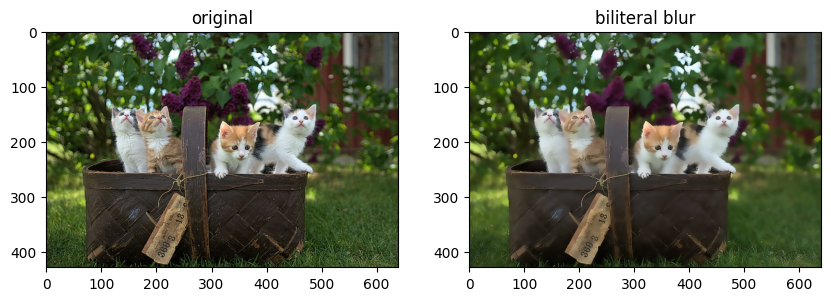

In [71]:
bi_blur = cv.bilateralFilter(img,11,sigmaColor= 75, sigmaSpace=75)

fig, ax = plt.subplots(1,2, figsize=(10, 10))

ax[0].imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
ax[0].set_title('original') # On bright pixel
ax[1].imshow(cv.cvtColor(bi_blur,cv.COLOR_BGR2RGB))
ax[1].set_title('biliteral blur')
plt.show()

summarize

Let's all kernel size 11x11

(Practically, they choose 3x3 or 5x5 as default)

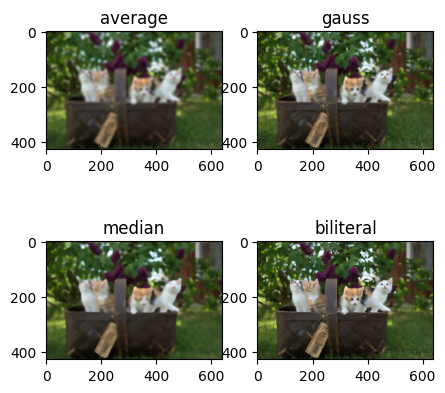

In [75]:
fig, ax = plt.subplots(2,2, figsize=(5, 5))

ax[0,0].imshow(cv.cvtColor(avg_blur_large,cv.COLOR_BGR2RGB))
ax[0,0].set_title('average') # On bright pixel

ax[0,1].imshow(cv.cvtColor(gaussian_blur,cv.COLOR_BGR2RGB))
ax[0,1].set_title('gauss') # On bright pixel

ax[1,0].imshow(cv.cvtColor(median_blur,cv.COLOR_BGR2RGB))
ax[1,0].set_title('median')

ax[1,1].imshow(cv.cvtColor(bi_blur,cv.COLOR_BGR2RGB))
ax[1,1].set_title('biliteral')

plt.show()

Biliteral is the best at edge detection

# BITWISE operation

- AND, OR, XOR, NOT
- We focus on creating *mask*, which have various shape, so we can crop with every possible shape 

In [91]:
img = cv.imread('images/Photos/cats 2.jpg')
print('img shape :', img.shape)
blank = np.zeros(img.shape[:2],dtype='uint8')

rectangle = cv.rectangle(blank.copy(),
                          pt1 = (30,30),
                          pt2 = (370,370),
                          color = 255,
                          thickness=cv.FILLED) # alternative : thickness=-1

circle = cv.circle(blank.copy(),
                   center = (200,200),
                   radius = 200,
                   color = 255,
                   thickness=cv.FILLED) # alternative : thickness=-1

img shape : (427, 640, 3)


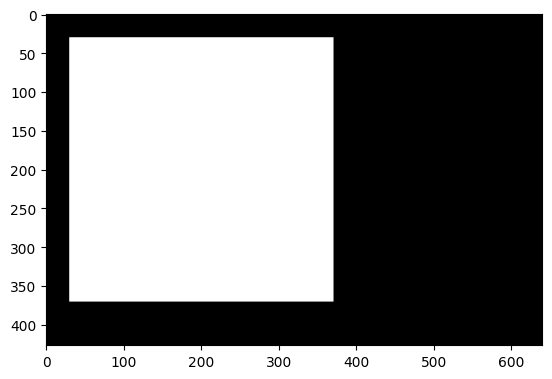

In [92]:
cv2_imshow(rectangle)

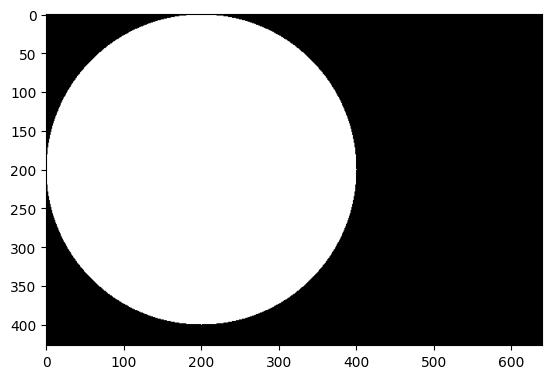

In [93]:
cv2_imshow(circle)

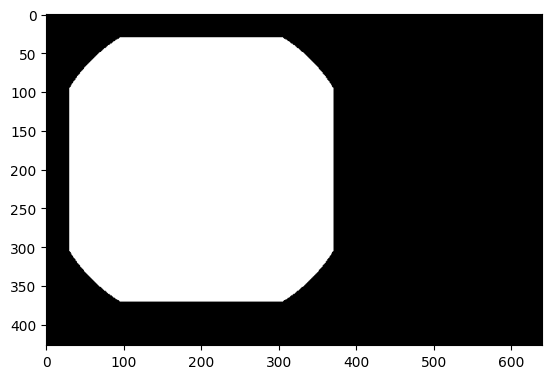

In [95]:
# We can create various shape with this operation
# If two images have same component, we can extract them out 

bitwise_and = cv.bitwise_and(rectangle,circle)
cv2_imshow(bitwise_and)

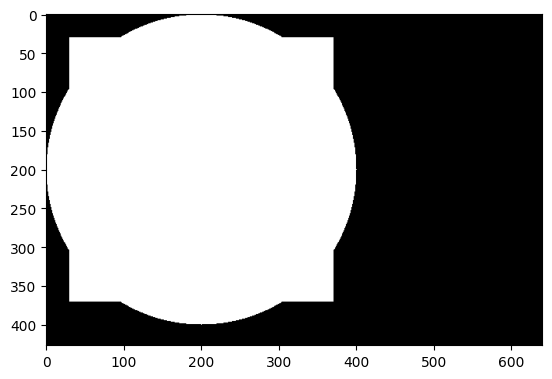

In [96]:
# OR

bitwise_or = cv.bitwise_or(rectangle,circle)
cv2_imshow(bitwise_or)

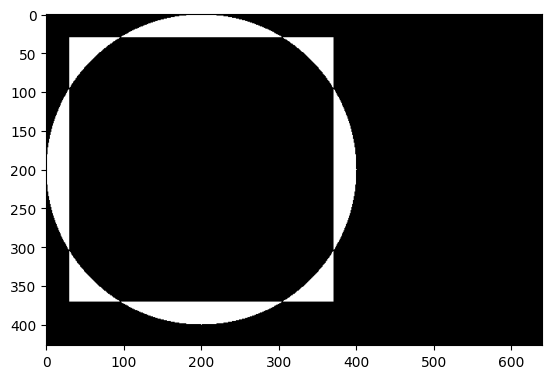

In [97]:
# XOR : Ignore intersect, only union part

bitwise_xor = cv.bitwise_xor(rectangle,circle)
cv2_imshow(bitwise_xor)

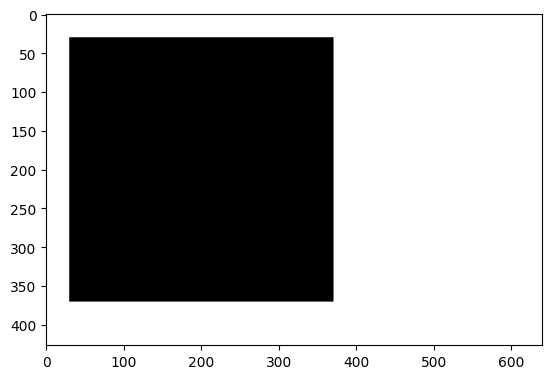

In [98]:
# This is useful when we switch the color
# Or anything that is not intersect

bitwise_not = cv.bitwise_not(rectangle,circle)
cv2_imshow(bitwise_not)

# Masking

- bitwise also have argument 'mask'

In [99]:
img = cv.imread('images/Photos/cats 2.jpg')
print('img shape :', img.shape)

img shape : (427, 640, 3)


In [102]:
# circle as mask
circle = cv.circle(blank.copy(),
                   center = (200,200),
                   radius = 200,
                   color = 255,
                   thickness=cv.FILLED) # alternative : thickness=-1

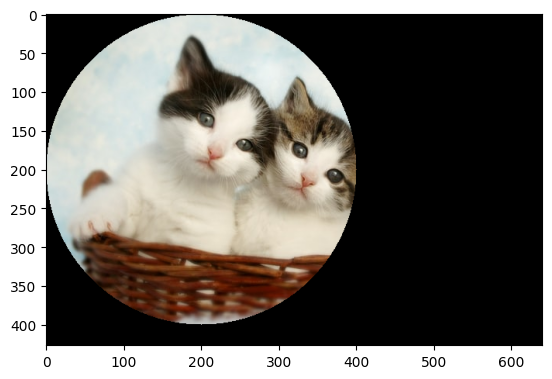

In [105]:
# The display part must have value as 255 (white)
mask = circle
circle_img = cv.bitwise_and(img,img,mask=mask)
cv2_imshow(circle_img)

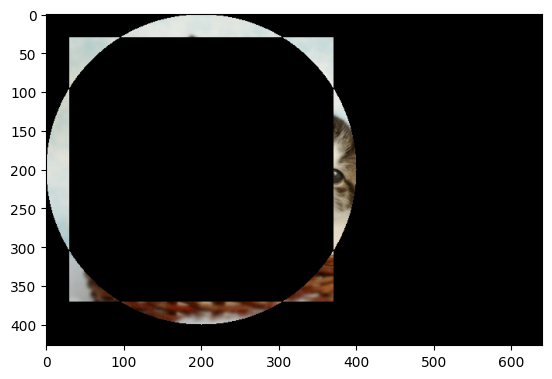

In [106]:
# or even
mask = bitwise_xor
xor_img = cv.bitwise_and(img,img,mask=mask)
cv2_imshow(xor_img)

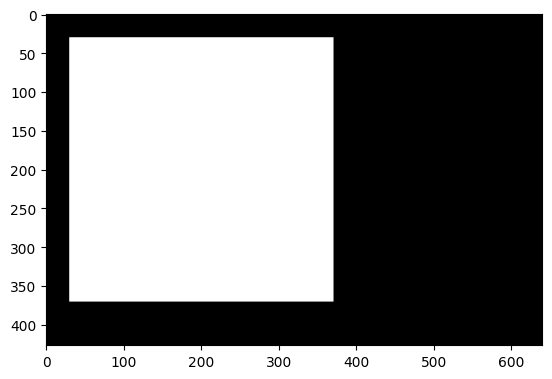

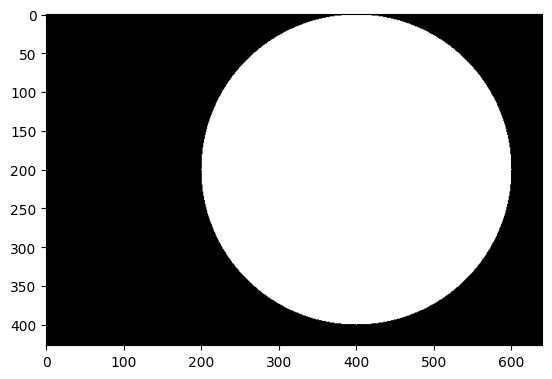

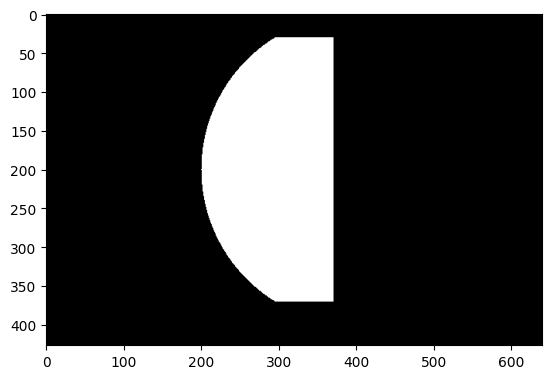

In [110]:
# Let's create new mask using bitwise_and

rectangle = cv.rectangle(blank.copy(),
                          pt1 = (30,30),
                          pt2 = (370,370),
                          color = 255,
                          thickness=cv.FILLED) # alternative : thickness=-1

circle = cv.circle(blank.copy(),
                   center = (400,200),
                   radius = 200,
                   color = 255,
                   thickness=cv.FILLED) # alternative : thickness=-1

weird_shape = cv.bitwise_and(rectangle,circle)

cv2_imshow(rectangle)
cv2_imshow(circle)
cv2_imshow(weird_shape)
# We will intersect these

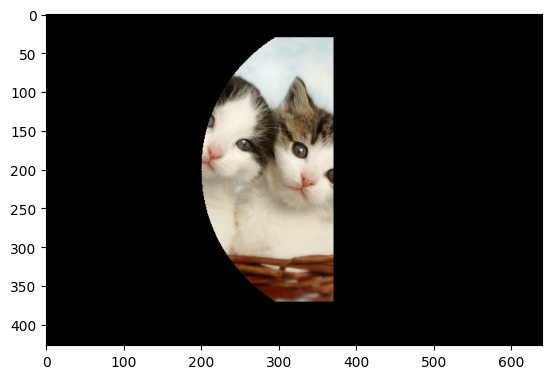

In [111]:
mask = weird_shape
weird_img = cv.bitwise_and(img,img,mask=mask)
cv2_imshow(weird_img)

# Histogram Computation

- To fine tune the thresholding of the image, it's important to know the pixel distribution of the part we want to keep
- Using historgram is good for analyzing

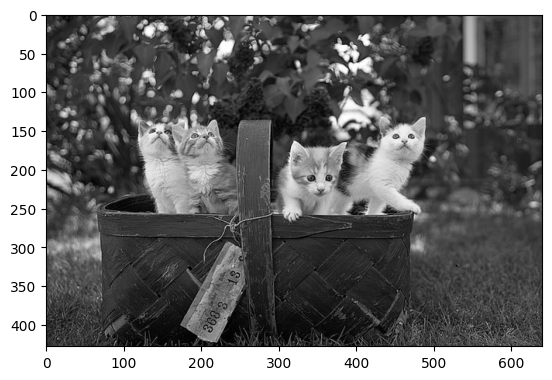

In [113]:
img = cv.imread('images/Photos/cats.jpg')

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)

# The nearly white pixel mostly from cats

In [123]:
gray_hist = cv.calcHist(images = [gray], # We only test for 1 images
                channels = [0], # Gray scale have only 1 channel, so channel index 0
               mask = None,
               histSize = [256],
               ranges = [0,256]) # None for this time 

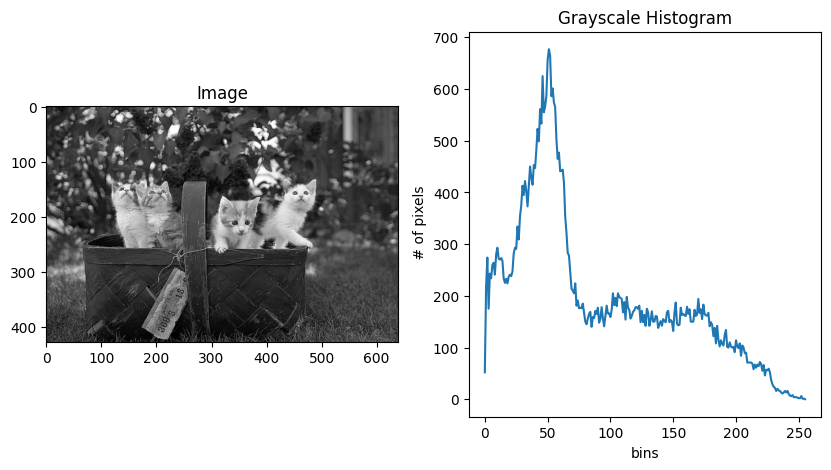

In [139]:
fig, ax = plt.subplots(1,2, figsize=(10, 5))

ax[0].imshow(gray,cmap='gray')
ax[0].set_title('Image')

ax[1].plot(gray_hist)
ax[1].set_title('Grayscale Histogram')
ax[1].set_xlabel('bins')
ax[1].set_ylabel(' # of pixels')

plt.show()

You may need to just want cats pixel value, we can do this by masking

In [148]:
blank = np.zeros(img.shape[:2],dtype='uint8')
mask = cv.rectangle(blank.copy(),
                      pt1 = (100,100),
                      pt2 = (500,250),
                      color = 255,
                      thickness=cv.FILLED) # alternative : thickness=-1

In [149]:
mask_gray_hist = cv.calcHist(images = [gray], # We only test for 1 images
                channels = [0], # Gray scale have only 1 channel, so channel index 0
               mask = mask,
               histSize = [256],
               ranges = [0,256]) # None for this time 

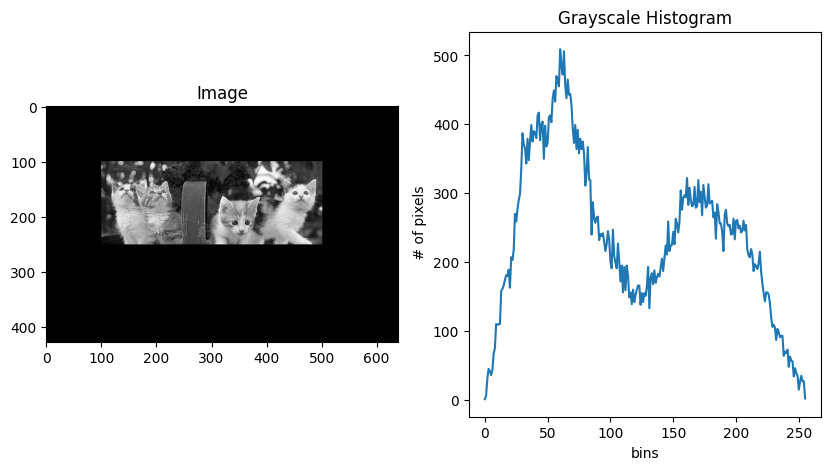

In [151]:
fig, ax = plt.subplots(1,2, figsize=(10, 5))

mask_gray = cv.bitwise_and(gray,gray,mask=mask)

ax[0].imshow(mask_gray,cmap='gray')
ax[0].set_title('Image')

ax[1].plot(mask_gray_hist)
ax[1].set_title('Grayscale Histogram')
ax[1].set_xlabel('bins')
ax[1].set_ylabel(' # of pixels')

plt.show()
# The cat skin is known as around the second peak at pixel value 150
# Note that the histogram ignore the pixel not in mask

What about the histogram for BGR image (expected 3 lines)

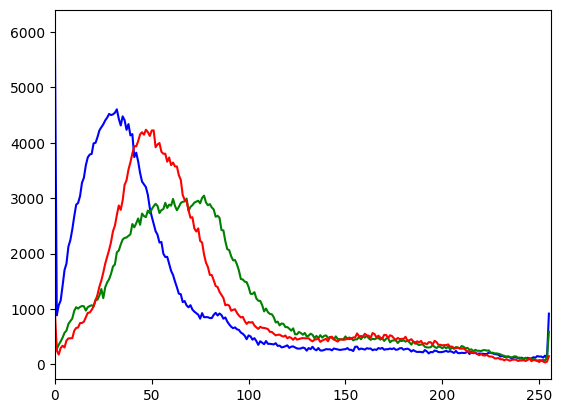

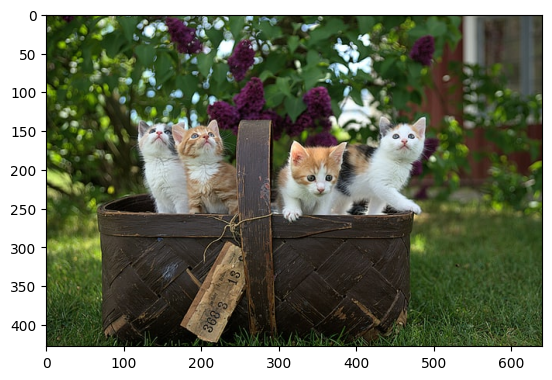

In [159]:
# Use img over gray

channel_lst = ['b', 'g', 'r'] # This is used for color line

for i, color in enumerate(channel_lst):
    hist = cv.calcHist(images = [img], 
                       channels = [i], # You can specify here {0: B, 1 : G, 2 : R}
                       mask = None,
                       histSize = [256],
                       ranges = [0,256])  
    
    plt.plot(hist, color = color)
    plt.xlim([0,256])

plt.show() # hist plot
cv2_imshow(img) # BGR image

# Thresholding, Binarize image

- after we got the insight from histogram, we now know which threshold range we used to get only cats picture


![](https://amroamroamro.github.io/mexopencv/opencv/thresholding_demo_03.png)

There are 3 main types of thresholding

1. simple thresholding
2. simple thresholding inverse 
3. adaptive threshold

## Simple thresholding

If the pixel value is in between the pixel value range, then the output is white (255), otherwise black (0)

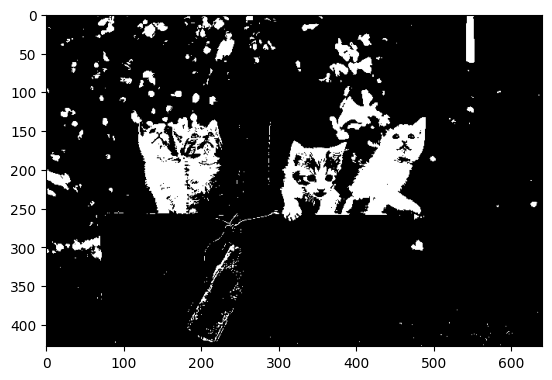

In [166]:
img = cv.imread('images/Photos/cats.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Recall that the range color pixel for cat is higher than 150 (ignore its eye)

# simple threshold
threshold, thresh = cv.threshold(gray, 150, 255,
                            type = cv.THRESH_BINARY)

cv2_imshow(thresh,'gray')
# The white part represent the pixel value which is more than 150 (in grayscale)

## Simple thresholding (Inverse)

Like the previous thresholding, but the output is switched

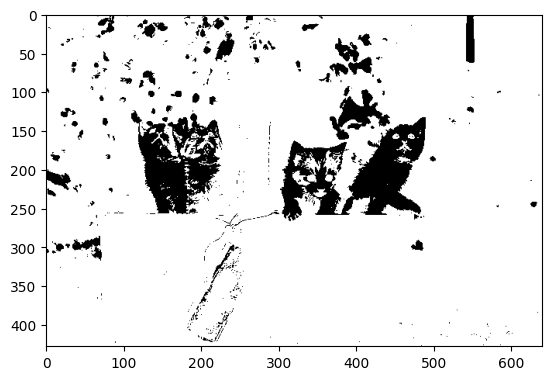

In [167]:
threshold, thresh_inv = cv.threshold(gray, 150, 255,
                            type = cv.THRESH_BINARY_INV)

cv2_imshow(thresh_inv,'gray')
# The white part represent the pixel value which is more than 150 (in grayscale)

## Adaptive thresholding 

- this will use kernel to threshold instead
- The idea is that the threshold for each local spatial feature is mean (or even gaussian weight)
- So, each local spatial feature have difference threshold

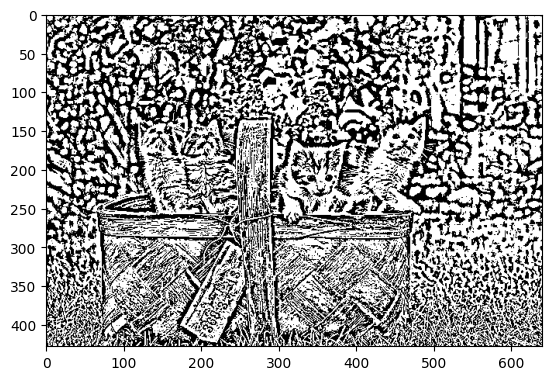

In [182]:
thresh_adp_mean = cv.adaptiveThreshold(gray, 
                                             # Ignore threshold, cuz it calculated for each local spatial feature
                                             maxValue = 255,
                                             adaptiveMethod = cv.ADAPTIVE_THRESH_MEAN_C, # Let's use mean for this cell,
                                             thresholdType = cv.THRESH_BINARY,
                                             blockSize = 11, # Since, it strides, it's kernel size
                                             C = 3) # Threshold = mean - 3 over mean for this cell (Can fine tune for this)


cv2_imshow(thresh_adp_mean,'gray')
# The white part represent the pixel value which is more than 150 (in grayscale)

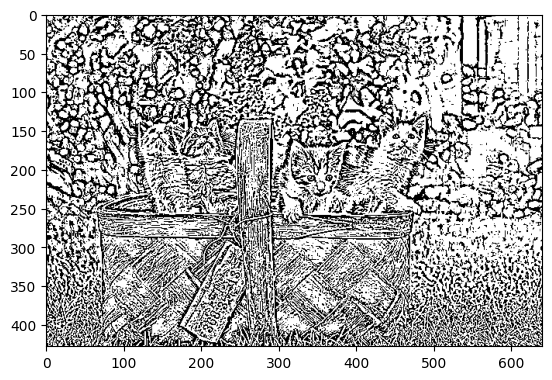

In [176]:
thresh_adp_gauss = cv.adaptiveThreshold(gray, 
                                             # Ignore threshold, cuz it calculated for each local spatial feature
                                             maxValue = 255,
                                             adaptiveMethod = cv.ADAPTIVE_THRESH_GAUSSIAN_C, # Let's use mean for this cell,
                                             thresholdType = cv.THRESH_BINARY,
                                             blockSize = 11, # Since, it strides, it's kernel size
                                             C = 3) # Threshold = mean - 3 over mean for this cell


cv2_imshow(thresh_adp_gauss,'gray')
# The white part represent the pixel value which is more than 150 (in grayscale)

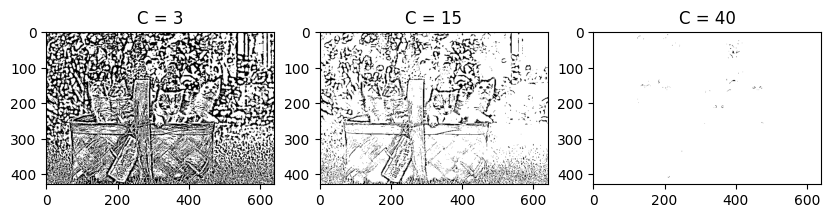

In [186]:
# Let's compare the difference in C

thresh_adp_mean3 = cv.adaptiveThreshold(gray, 
                         # Ignore threshold, cuz it calculated for each local spatial feature
                         maxValue = 255,
                         adaptiveMethod = cv.ADAPTIVE_THRESH_MEAN_C, # Let's use mean for this cell,
                         thresholdType = cv.THRESH_BINARY,
                         blockSize = 11, # Since, it strides, it's kernel size
                         C = 3) # Threshold = mean - 3 over mean for this cell (Can fine tune for this)

thresh_adp_mean15 = cv.adaptiveThreshold(gray, 
                         maxValue = 255,
                         adaptiveMethod = cv.ADAPTIVE_THRESH_MEAN_C, 
                         thresholdType = cv.THRESH_BINARY,
                         blockSize = 11,
                         C = 15)

thresh_adp_mean100 = cv.adaptiveThreshold(gray, 
                         maxValue = 255,
                         adaptiveMethod = cv.ADAPTIVE_THRESH_MEAN_C, 
                         thresholdType = cv.THRESH_BINARY,
                         blockSize = 11,
                         C = 100)

fig, ax = plt.subplots(1,3, figsize=(10, 5))

ax[0].imshow(thresh_adp_mean3,cmap='gray')
ax[0].set_title('C = 3')

ax[1].imshow(thresh_adp_mean15,cmap='gray')
ax[1].set_title('C = 15')

ax[2].imshow(thresh_adp_mean100,cmap='gray')
ax[2].set_title('C = 40')

plt.show()

The higher C is, the higher number of pixel you allowed to be white

# Edge Detection

We have talked a lot on canny detection, but in face there so many types including

- Laplacian
- Sobel
- (canny)

Here's the laplacian filter
![](https://aishack.in/static/img/tut/conv-laplacian.jpg)


In [190]:
img = cv.imread('images/Photos/park.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('Gray', gray)

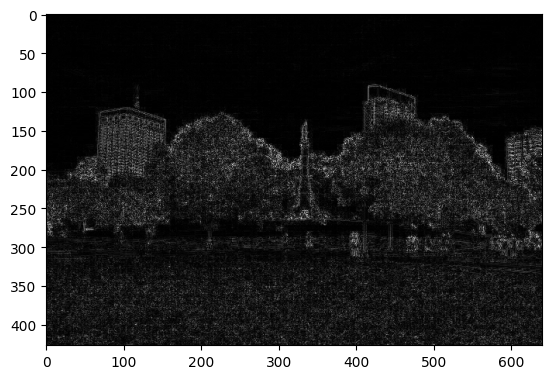

In [205]:
# Laplacian

# ddepth : depth specifies the number of bits used to represent each pixel in the image.
# 8U give low quality
# 64F give high quality

lap = cv.Laplacian(gray, ddepth = cv.CV_64F)
lap = np.uint8(np.absolute(lap)) # unsigned int 8 bit ([0-255])
cv2_imshow(lap)

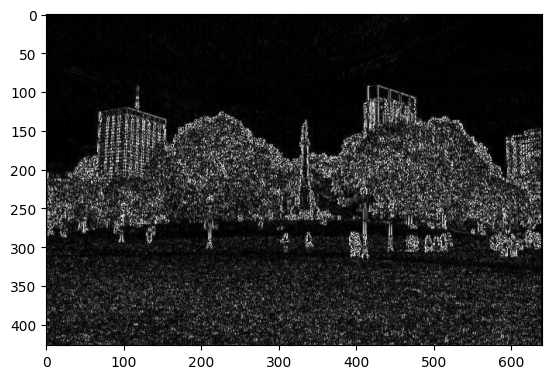

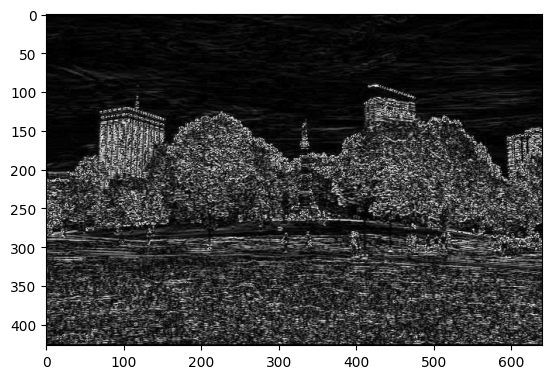

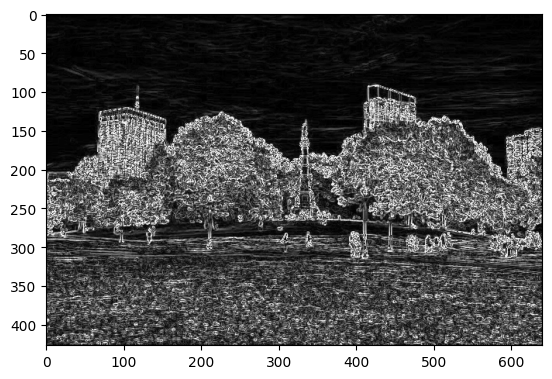

In [206]:
# Sobel 
sobelx = cv.Sobel(gray, cv.CV_64F, dx = 1, dy = 0)
sobelx = np.uint8(np.absolute(sobelx))
sobely = cv.Sobel(gray, cv.CV_64F, dx = 0, dy = 1)
sobely = np.uint8(np.absolute(sobely))
combined_sobel = cv.bitwise_or(sobelx, sobely)

cv2_imshow(sobelx, 'gray')
cv2_imshow(sobely)
cv2_imshow(combined_sobel)

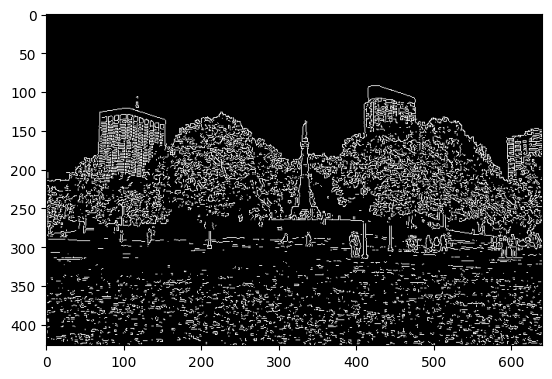

In [208]:
# Canny (This also employ sobel as a stage)
canny = cv.Canny(gray, 150, 175)
cv2_imshow(canny)

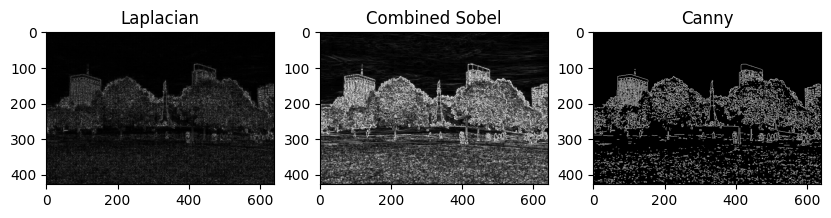

In [209]:
fig, ax = plt.subplots(1,3, figsize=(10, 5))

ax[0].imshow(lap,cmap='gray')
ax[0].set_title('Laplacian')

ax[1].imshow(combined_sobel,cmap='gray')
ax[1].set_title('Combined Sobel')

ax[2].imshow(canny,cmap='gray')
ax[2].set_title('Canny')

plt.show()

Most case : canny 

More advanced case : Sobel